In [4]:
import os
import numpy as np
from PIL import Image
import torch
from torchvision import models, transforms
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import shutil
import random
import pandas as pd

# Klateryzacja danych w celu sprawdzenia redundancji

Dobre wyniki modelu klasyfikującego wydają się być skutkiem trenowania na zbliżonych zdjęciach i również testowania. Model wydaje się, że jest nauczony na pamięć i stąd jego dobra skuteczność 98%.

In [2]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
resnet = models.resnet50(pretrained=True)
feature_extractor = torch.nn.Sequential(*list(resnet.children())[:-1])

c:\Users\alapr\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\alapr\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
def extract_features(folder):
    features = []
    filenames = []
    for f in os.listdir(folder):
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")):
            path = os.path.join(folder, f)
            try:
                img = Image.open(path).convert('RGB')
                img_tensor = transform(img).unsqueeze(0)
                with torch.no_grad():
                    feat = feature_extractor(img_tensor).squeeze().numpy()
                features.append(feat.flatten())
                filenames.append(f)
            except Exception as e:
                print(f"Błąd przy {path}:", e)
    return np.array(features), filenames


In [4]:
def perform_clustering(folder_name):
    folder = f"output/{folder_name}"
    feature_extractor.eval()
    
    features, filenames = extract_features(folder)

    if features.shape[0] == 0:
        print("Brak danych")
    else:
        print("Redukcja wymiarów")
        features_pca = PCA(n_components=50).fit_transform(features)
        
    print("Klasteryzacja")
    clustering = DBSCAN(eps=5, min_samples=2).fit(features_pca)
    labels = clustering.labels_

    label_counts = Counter(labels)

    n_total = len(labels)
    n_unique = label_counts[-1] if -1 in label_counts else 0
    n_clustered = n_total - n_unique
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

    print("\n Podsumowanie:")
    print(f"Całkowita liczba zdjęć: {n_total}")
    print(f"Liczba zdjęć w klastrach: {n_clustered}")
    print(f"Liczba zdjęć unikalnych (outliery): {n_unique}")
    print(f"Liczba wykrytych klastrów: {n_clusters}")
    
    sorted_clusters = [(cid, cnt) for cid, cnt in label_counts.items() if cid != -1]
    sorted_clusters.sort(key=lambda x: x[1], reverse=True)
    sorted_cluster_ids = np.array([cid for cid, _ in sorted_clusters])

    return features, labels, filenames, n_total, n_clustered, n_unique, n_clusters, sorted_cluster_ids

Funkcja pokazująca zdjęcia z danego klastra. Za pomocą zwracanej tablicy array z funckcji 'perform_clustering' można zobaczyć numery klastrów uporządkowane malejącą liczbą zdjęć.

In [5]:
def show_cluster_images(cluster_label, labels, folder_name, filenames, num_per_row=5):
    folder = f"output/{folder_name}"
    indices = [i for i, label in enumerate(labels) if label == cluster_label]
    
    if not indices:
        print(f"Brak zdjęć w klastrze {cluster_label}")
        return
    
    print(f"Klastrowi {cluster_label} przypisano {len(indices)} zdjęć")
    
    n = len(indices)
    rows = (n + num_per_row - 1) // num_per_row
    
    fig, axs = plt.subplots(rows, num_per_row, figsize=(15, 3 * rows))
    axs = axs.flatten()

    for ax in axs[n:]:
        ax.axis('off') 

    for i, idx in enumerate(indices):
        img_path = os.path.join(folder, filenames[idx])
        img = Image.open(img_path)
        axs[i].imshow(img)
        axs[i].set_title(filenames[idx], fontsize=8)
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()


Funkcja wyświetlająca 10 losowych unikalnych zdjęć. Można sprawdzić czy rzeczywiście zdjęcia są różne.

In [33]:
def show_outliers(labels, folder_name, filenames, num_images_to_show=10):
    cluster_label=-1
    folder = f"output/{folder_name}"

    indices = [i for i, label in enumerate(labels) if label == cluster_label]
    
    if not indices:
        print(f"Brak zdjęć w klastrze {cluster_label}")
        return
    
    print(f"Klastrowi {cluster_label} przypisano {len(indices)} zdjęć")

    indices = random.sample(indices, min(num_images_to_show, len(indices)))
    n = len(indices)
    rows = (n + 4) // 5 
    
    fig, axs = plt.subplots(rows, 5, figsize=(15, 3 * rows))
    axs = axs.flatten()

    for ax in axs[n:]:
        ax.axis('off')
    
    for i, idx in enumerate(indices):
        img_path = os.path.join(folder, filenames[idx])
        img = Image.open(img_path)
        axs[i].imshow(img)
        axs[i].set_title(filenames[idx], fontsize=8)
        axs[i].axis('off')  
    
    plt.tight_layout()
    plt.show()

Funckja zapisująca potencjalnie zbiór bardziej unikalnych zdjęć czyli wszystkie outliery plus losowe zdjęcie z każdego klastra.

In [37]:
def save_cluster_images(features, labels, filenames, folder_name, output_folder="output_samples"):
    if features is None:
        print("Brak danych do zapisania")
        return
    
    cluster_to_files = defaultdict(list)
    for label, filename in zip(labels, filenames):
        cluster_to_files[label].append(filename)

    os.makedirs(output_folder, exist_ok=True)

    for cluster_id, files in cluster_to_files.items():
        selected_files = files if cluster_id == -1 else [random.choice(files)] 

        for f in selected_files:
            label_name = f.split("_")[0] 

            src_path = os.path.join(f"output/{folder_name}", f)
            dst_dir = os.path.join(output_folder, label_name)
            os.makedirs(dst_dir, exist_ok=True)
            dst_path =  dst_path = os.path.join(dst_dir, f) 
            
            try:
                shutil.copyfile(src_path, dst_path)
                #print(f"Zapisano: {f} (klaster {cluster_id}) → {dst_path}")
            except FileNotFoundError:
                print(f"Nie znaleziono pliku: {src_path}")

In [39]:
features_AVM, labels_AVM, filenames_AVM, n_total_AVM, n_clustered_AVM, n_unique_AVM, n_clusters_AVM, sorted_clusters_AVM = perform_clustering("AVM")

Redukcja wymiarów
Klasteryzacja

 Podsumowanie:
Całkowita liczba zdjęć: 668
Liczba zdjęć w klastrach: 358
Liczba zdjęć unikalnych (outliery): 310
Liczba wykrytych klastrów: 80


In [40]:
sorted_clusters_AVM[0:5]

array([32, 33, 40, 50, 10])

Klastrowi 32 przypisano 31 zdjęć


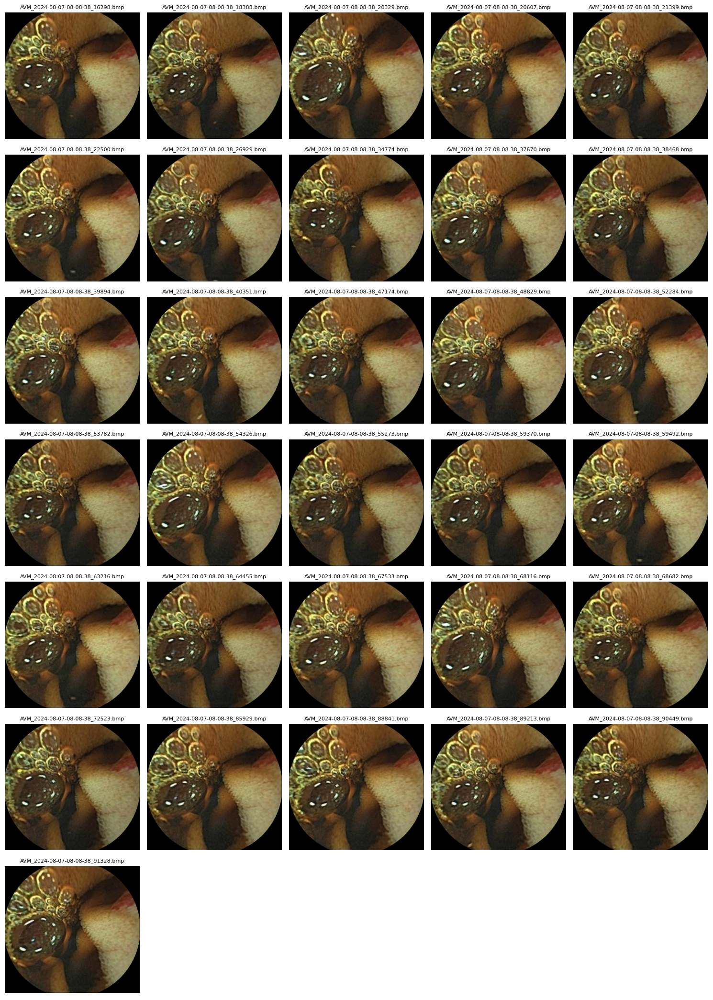

In [20]:
show_cluster_images(32, labels_AVM, "AVM", filenames_AVM)

Klastrowi 33 przypisano 31 zdjęć


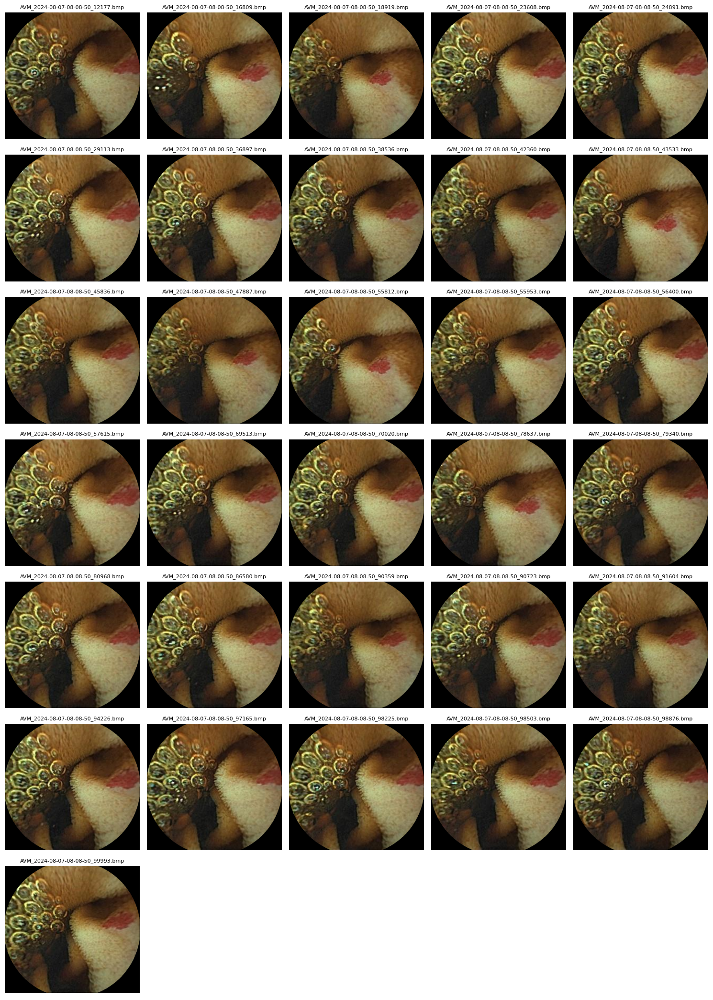

In [21]:
show_cluster_images(33, labels_AVM, "AVM", filenames_AVM)

In [41]:
features_Ulcer, labels_Ulcer, filenames_Ulcer, n_total_Ulcer, n_clustered_Ulcer, n_unique_Ulcer, n_clusters_Ulcer, sorted_clusters_Ulcer = perform_clustering("Ulcer")

Redukcja wymiarów
Klasteryzacja

 Podsumowanie:
Całkowita liczba zdjęć: 465
Liczba zdjęć w klastrach: 157
Liczba zdjęć unikalnych (outliery): 308
Liczba wykrytych klastrów: 49


In [42]:
sorted_clusters_Ulcer[0:5]

array([27,  2, 22,  4, 10])

Klastrowi 27 przypisano 23 zdjęć


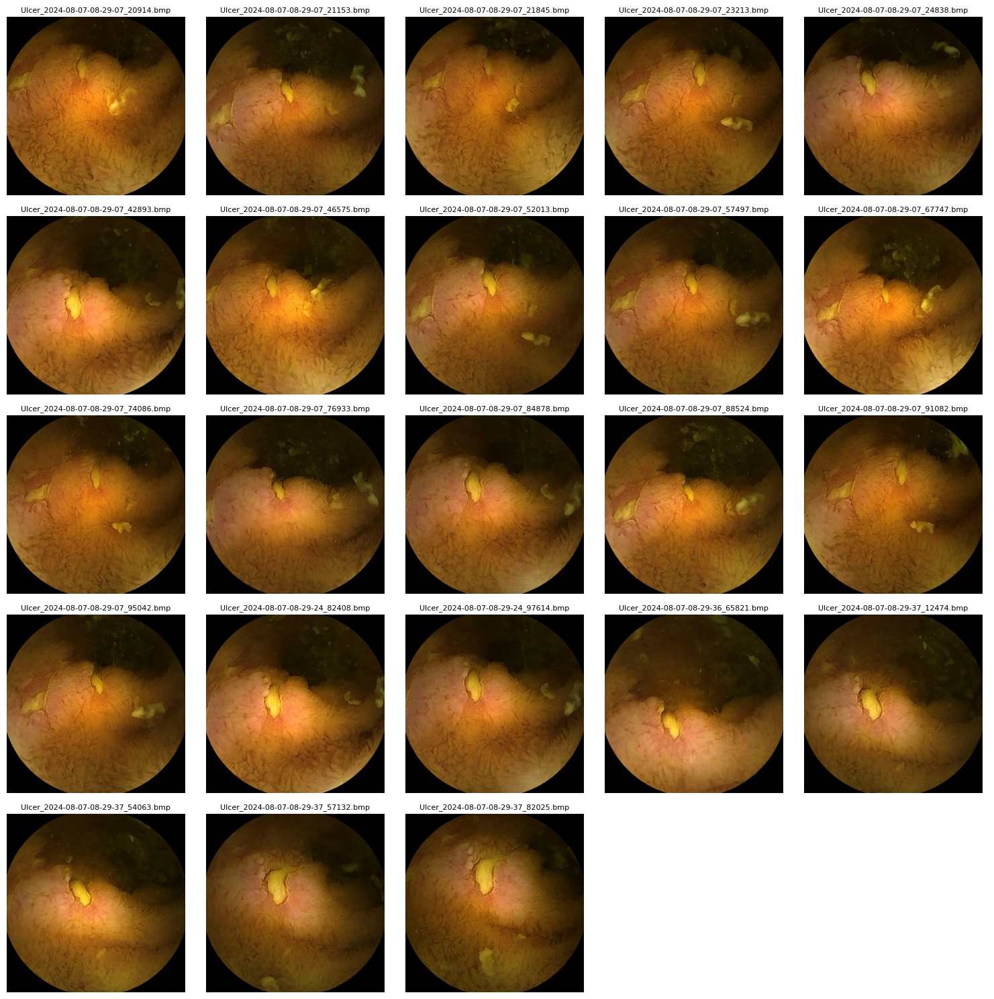

In [24]:
show_cluster_images(27, labels_Ulcer, "Ulcer", filenames_Ulcer)

In [7]:
features_Normal, labels_Normal, filenames_Normal, n_total_Normal, n_clustered_Normal, n_unique_Normal, n_clusters_Normal, sorted_clusters_Normal = perform_clustering("Normal")

Redukcja wymiarów
Klasteryzacja

 Podsumowanie:
Całkowita liczba zdjęć: 2152
Liczba zdjęć w klastrach: 762
Liczba zdjęć unikalnych (outliery): 1390
Liczba wykrytych klastrów: 216


In [8]:
sorted_clusters_Normal[0:5]

array([195, 139, 166, 149,  24])

Klastrowi 195 przypisano 26 zdjęć


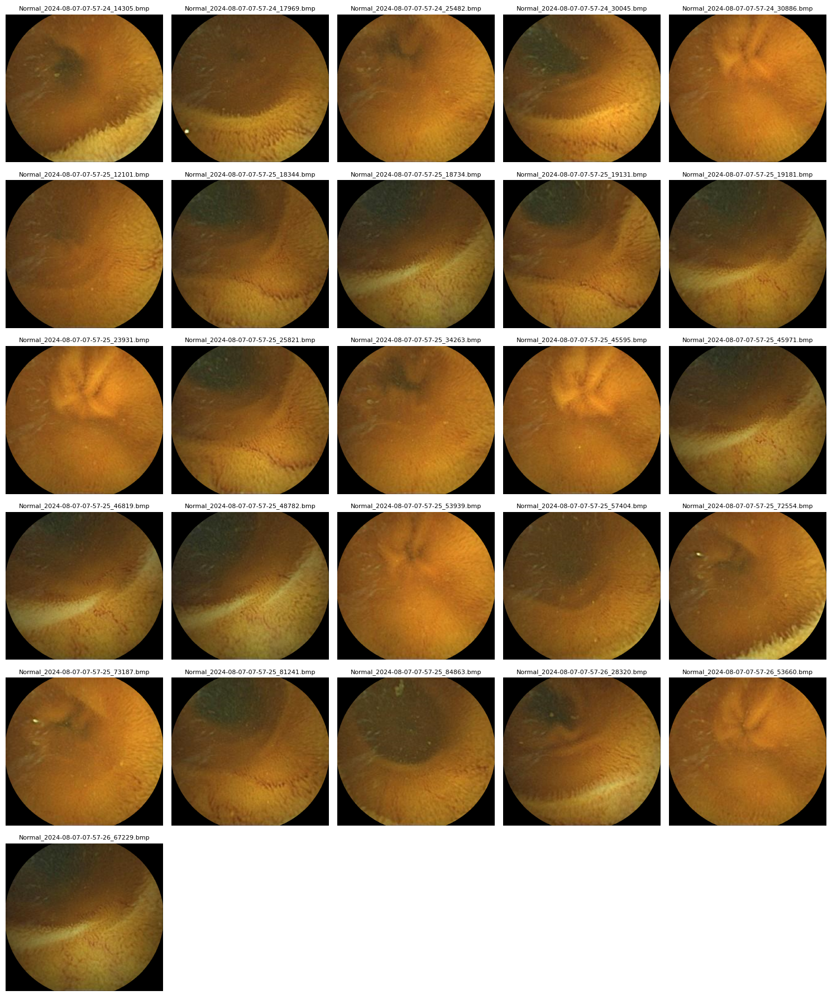

In [9]:
show_cluster_images(195, labels_Normal, "Normal", filenames_Normal)

Klastrowi 139 przypisano 22 zdjęć


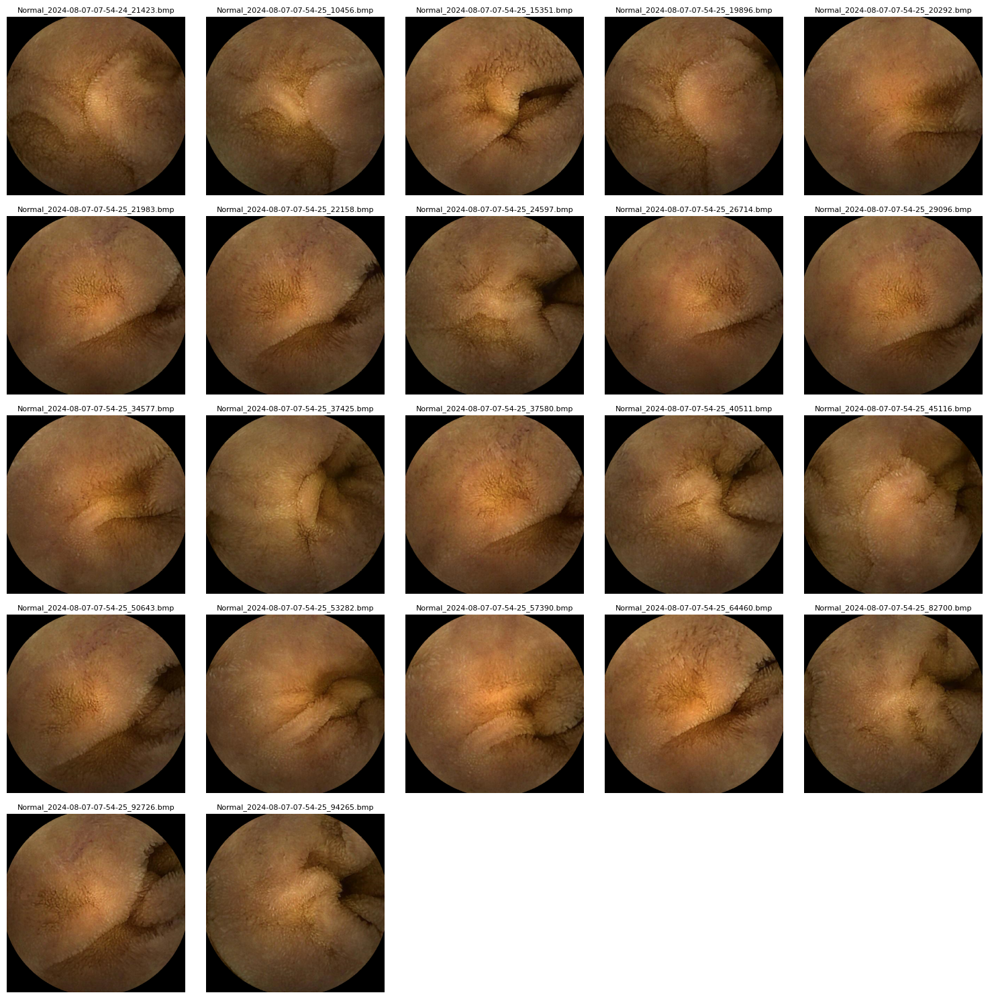

In [11]:
show_cluster_images(139, labels_Normal, "Normal", filenames_Normal)

Zdjęcia szczególnie klas AVM i Ulcer w przypisanych klasach wydają się być bardzo identyczne stąd zasadniczym wydaje się pozbycie się duplikatów nawet jeśli ma to zmniejszyć zbiór danych (pomimo i tak małych rozmiarów).

Klastrowi -1 przypisano 1390 zdjęć


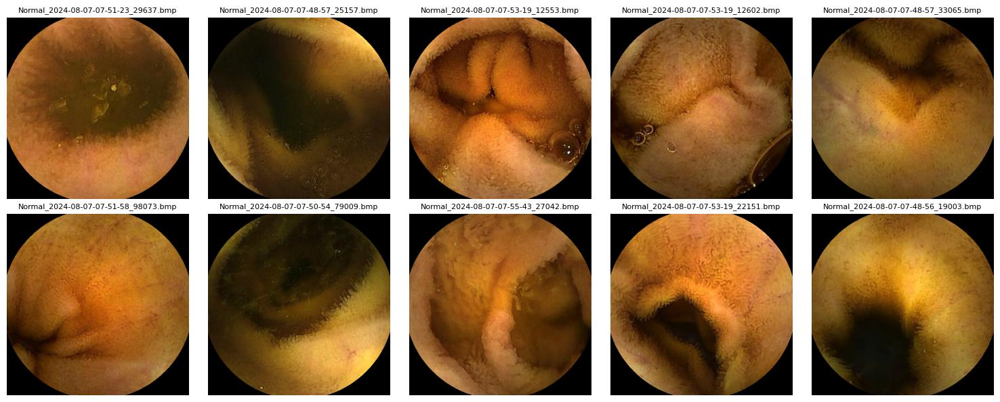

In [32]:
show_outliers(labels_Normal, "Normal", filenames_Normal)

Zbiór outlierów (unikalnych zdjęć) sprawia wrażenie nawet różnorodnego.

### Zapis potencjalnie unikalnych zdjęć do folderu output_samples
Zapis w celu sprawdzenia jak model wytrenowany na tych danych będzie sobie radził.

In [38]:
save_cluster_images(features_Normal, labels_Normal, filenames_Normal, "Normal")

In [43]:
save_cluster_images(features_AVM, labels_AVM, filenames_AVM, "AVM")

In [44]:
save_cluster_images(features_Ulcer, labels_Ulcer, filenames_Ulcer, "Ulcer")

In [5]:
parent_folder = "output"
output_data = []  

for folder in os.listdir(parent_folder):
    folder_path = os.path.join(parent_folder, folder)
    if os.path.isdir(folder_path):
        count = sum(1 for f in os.listdir(folder_path) if f.endswith(".bmp"))
        output_data.append([folder, count])  
df_output = pd.DataFrame(output_data, columns=["Nazwa klasy", "Liczba zdjęć"])
df_output

,Nazwa klasy,Liczba zdjęć
0,AVM,668
1,Normal,2152
2,Ulcer,465


In [6]:
parent_folder = "output_samples"
output_data = []  

for folder in os.listdir(parent_folder):
    folder_path = os.path.join(parent_folder, folder)
    if os.path.isdir(folder_path):
        count = sum(1 for f in os.listdir(folder_path) if f.endswith(".bmp"))
        output_data.append([folder, count])  
df_output = pd.DataFrame(output_data, columns=["Nazwa klasy", "Liczba zdjęć"])
df_output

,Nazwa klasy,Liczba zdjęć
0,AVM,390
1,Normal,1606
2,Ulcer,357


Spora część zdjęć została usunięta.